# Тест языковых запросов к визуальным признакам изображения с помощью NARADIO

## Что предлагают RayFronts

[RayFronts](https://github.com/RayFronts/RayFronts) предложили метод маппинга пространства признаков текста в пространсто признаков картинки с помощью объединени NACLIP и RADIO.

В соответствии с моими предыдущими тестами (и тестами RayFronts) лучше использовать `siglip2-g` адаптер -- он даёт менее шумные признаки.

In [ ]:
from transformers import AutoModel, CLIPImageProcessor
import torch
import torchvision
from rayfronts.image_encoders.naradio import NARadioEncoder

# input_res = [640, 352]
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

enc = NARadioEncoder(model_version="c-radio_v3-h", lang_model="siglip2-g", # radio_v2.5-b + siglip
                     device=device)
# 5.9 GB

/home/bashmac/MIPT/.venv/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


/home/bashmac/MIPT/test_SLAM


/home/bashmac/MIPT/.venv/lib/python3.10/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
Unable to import openvdb. Make sure you compiled it. Will not import mappers that depend on it.
ROS2 modules not found !


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


Using cache found in /home/bashmac/.cache/torch/hub/NVlabs_RADIO_main


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


input_res=Resolution(height=1088, width=1920)


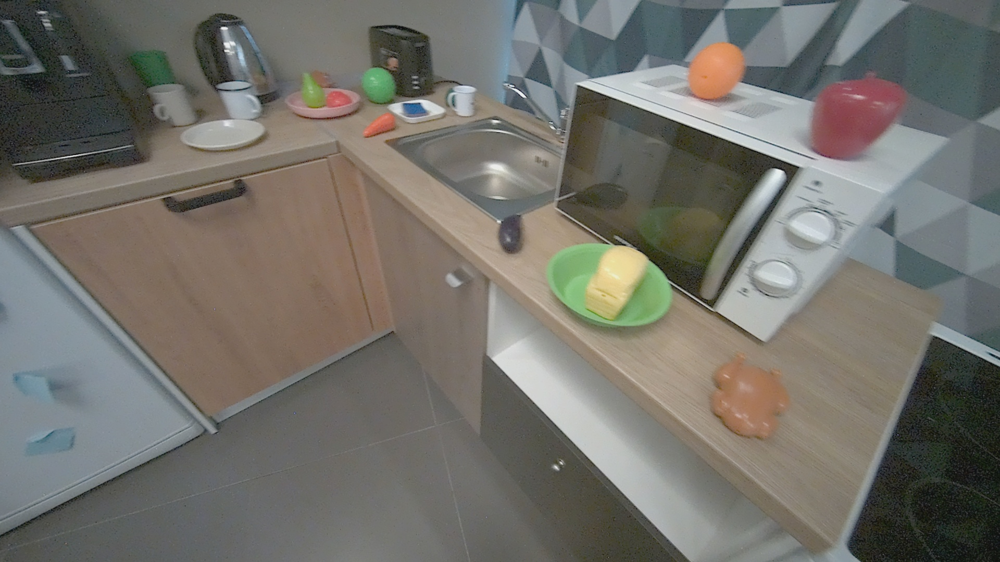

In [3]:
from PIL import Image
from torchvision.transforms.functional import pil_to_tensor, to_pil_image
from torch.nn import functional as F
from torchvision.io import read_image
from typing import List, Tuple, Dict

image_tensor = []
image = []
input_res = []

def rescale_res(resolution: Tuple[int], desired: Tuple[int]):
    rows, cols = resolution[-2], resolution[-1]
    if len(desired) == 1: # desired min side
        desired_min_side = desired[0]
        if rows <= cols:
            return desired_min_side, int(desired_min_side*cols/rows)
        return int(desired_min_side*rows/cols), desired_min_side
    return desired

@torch.no_grad()
def read_img(img_path: str, desired_res: Tuple[int]=None):
    global image_tensor, image, enc, input_res
    image_tensor = read_image(img_path) / 255
    image = to_pil_image(image_tensor)
    tensor_shape = image_tensor.shape[-2], image_tensor.shape[-1]
    if desired_res:
        tensor_shape = rescale_res(tensor_shape, desired_res)
        
    input_res = enc.get_nearest_size(*tensor_shape)
    print(f'{input_res=}')
    
    image_tensor = image_tensor.unsqueeze(0).to(device)
    image_tensor = F.interpolate(image_tensor, input_res, mode='bilinear')
    
    enc.input_resolution = input_res
    torch.cuda.empty_cache()

read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/sber.jpg')
image
# 6.9

In [4]:
image_tensor.max()

tensor(0.9504, device='cuda:0')

In [5]:
image_features = []

@torch.no_grad()
def extract_image_features():
    global image_features
    feat_map_unalignded = enc.encode_image_to_feat_map(image_tensor)
    # тот самый шаг маппинга пространства плотных признаков к пространству текстовых
    image_features = enc.align_spatial_features_with_language(feat_map_unalignded)
    image_features = image_features.permute(0, 2, 3, 1)
    print(f'{image_features.shape=}\n')
extract_image_features()
# 12.1 GB

image_features.shape=torch.Size([1, 68, 120, 1536])



In [6]:
text = ["oven"]
text_features = []

@torch.no_grad()
def extract_text_features():
    global text_features
    text_features = enc.encode_labels(text)
    
extract_text_features()
# 12.7 GB

In [7]:
similarity = []

@torch.no_grad()
def calc_similarity():
    global similarity
    img_features_expanded = image_features.expand(len(text_features), *image_features.shape[1:]).cuda()
    text_features_expanded = text_features.unsqueeze(1).unsqueeze(1)

    similarity = torch.cosine_similarity(img_features_expanded, text_features_expanded, dim=-1).unsqueeze(-1)

calc_similarity()

similarity.shape=torch.Size([1, 68, 120, 1])
similarity.min()=tensor(-0.0622, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1158, device='cuda:0', dtype=torch.float16)


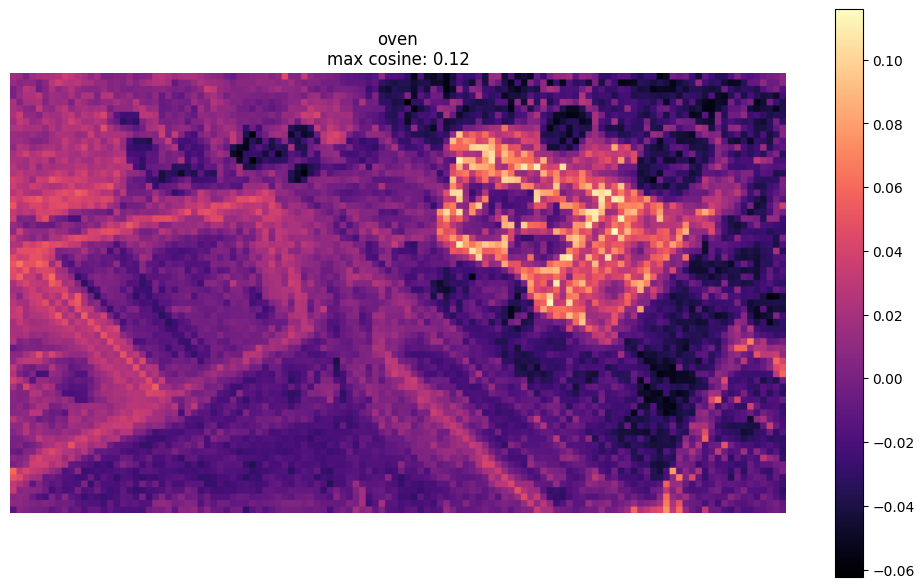

In [8]:
from torch.nn import functional as F
import matplotlib.pyplot as plt

def plot_similarity():
    similarity_scaled = F.interpolate(
        similarity.permute(0, 3, 1, 2),
        input_res
    ).squeeze().cpu().numpy()
    
    print(f'{similarity.shape=}\n{similarity.min()=}\n{similarity.max()=}')
    
    figsize = rescale_res(input_res, [6])[::-1]

    plt.figure(figsize=figsize)
    plt.axis('off')
    plt.imshow(similarity_scaled, cmap='magma')
    plt.colorbar()
    plt.title(f'{text[0]}\nmax cosine: {similarity.max():.2}')
    plt.tight_layout()
    plt.show()
    
plot_similarity()

image_features.shape=torch.Size([1, 68, 120, 1536])

similarity.shape=torch.Size([1, 68, 120, 1])
similarity.min()=tensor(-0.0591, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1851, device='cuda:0', dtype=torch.float16)


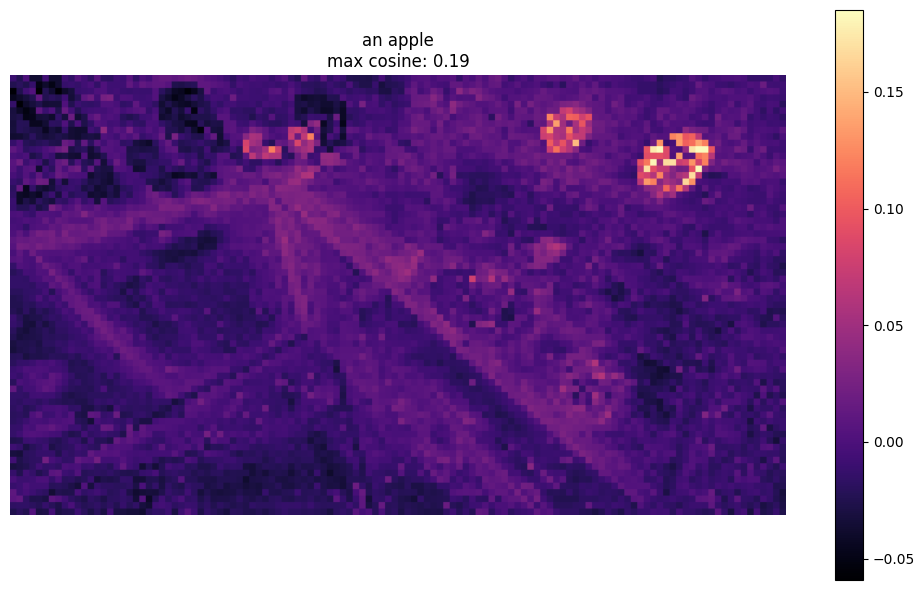

In [9]:
def regenerate_all():
    extract_image_features()
    extract_text_features()
    calc_similarity()
    plot_similarity()
    torch.cuda.empty_cache()

text = ['an apple']
regenerate_all()
# 13.9 GB

image_features.shape=torch.Size([1, 68, 120, 1536])

similarity.shape=torch.Size([1, 68, 120, 1])
similarity.min()=tensor(-0.0349, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.0557, device='cuda:0', dtype=torch.float16)


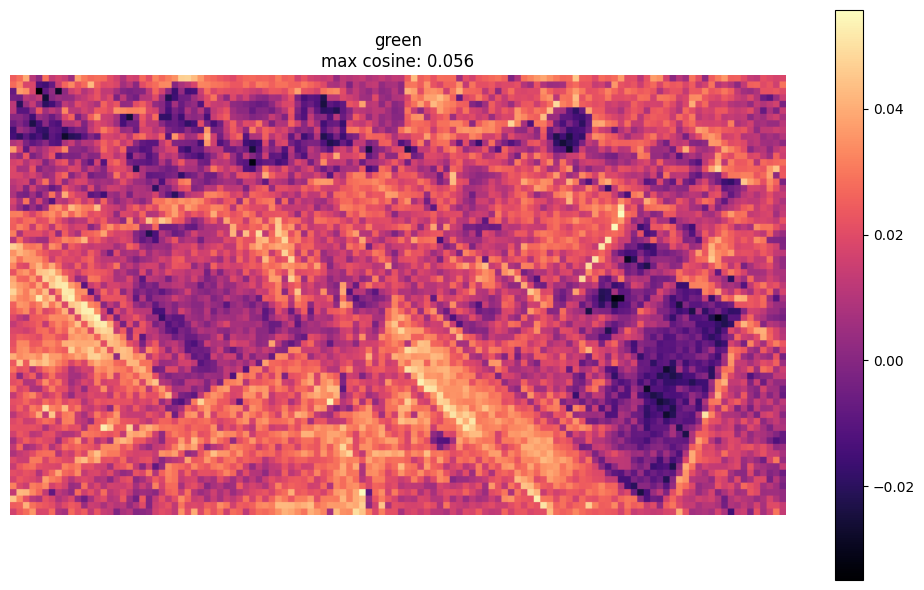

In [10]:
text = ['green']
regenerate_all()

image_features.shape=torch.Size([1, 68, 120, 1536])

similarity.shape=torch.Size([1, 68, 120, 1])
similarity.min()=tensor(-0.0430, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.0811, device='cuda:0', dtype=torch.float16)


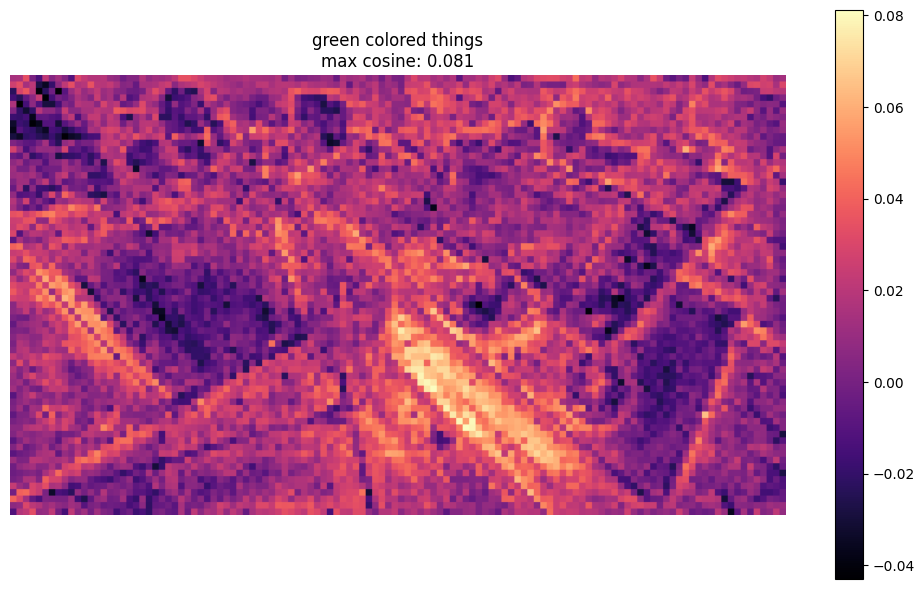

In [11]:
text = ['green colored things']
regenerate_all()

image_features.shape=torch.Size([1, 68, 120, 1536])

similarity.shape=torch.Size([1, 68, 120, 1])
similarity.min()=tensor(-0.0475, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.0828, device='cuda:0', dtype=torch.float16)


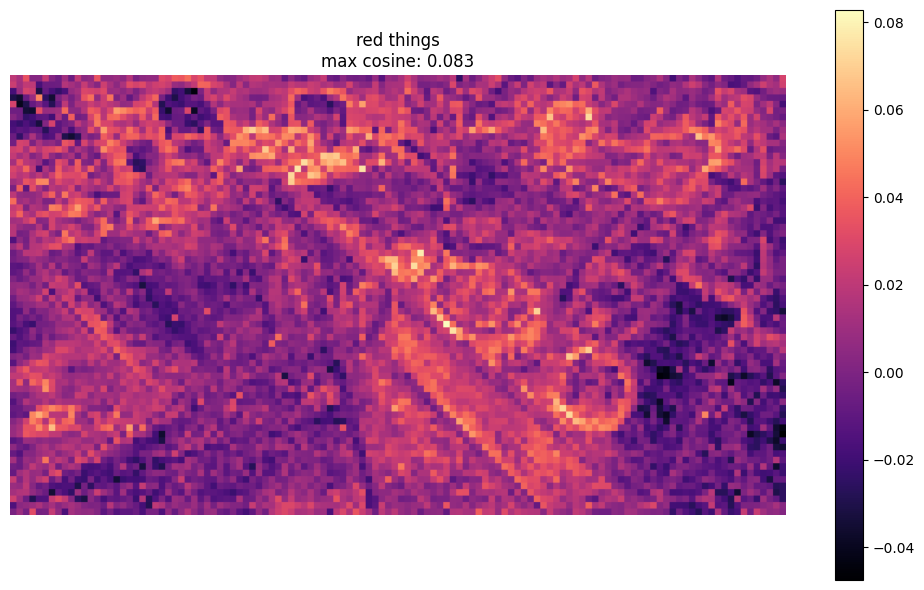

In [12]:
text = ['red things']
regenerate_all()

image_features.shape=torch.Size([1, 68, 120, 1536])

similarity.shape=torch.Size([1, 68, 120, 1])
similarity.min()=tensor(-0.0696, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1851, device='cuda:0', dtype=torch.float16)


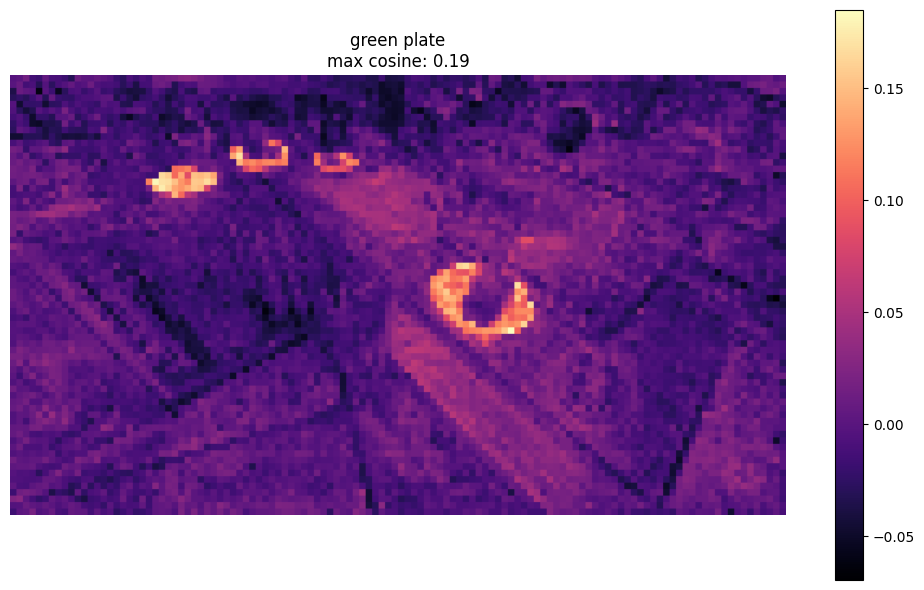

In [13]:
text = ['green plate']
regenerate_all()

image_features.shape=torch.Size([1, 68, 120, 1536])

similarity.shape=torch.Size([1, 68, 120, 1])
similarity.min()=tensor(-0.0577, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1952, device='cuda:0', dtype=torch.float16)


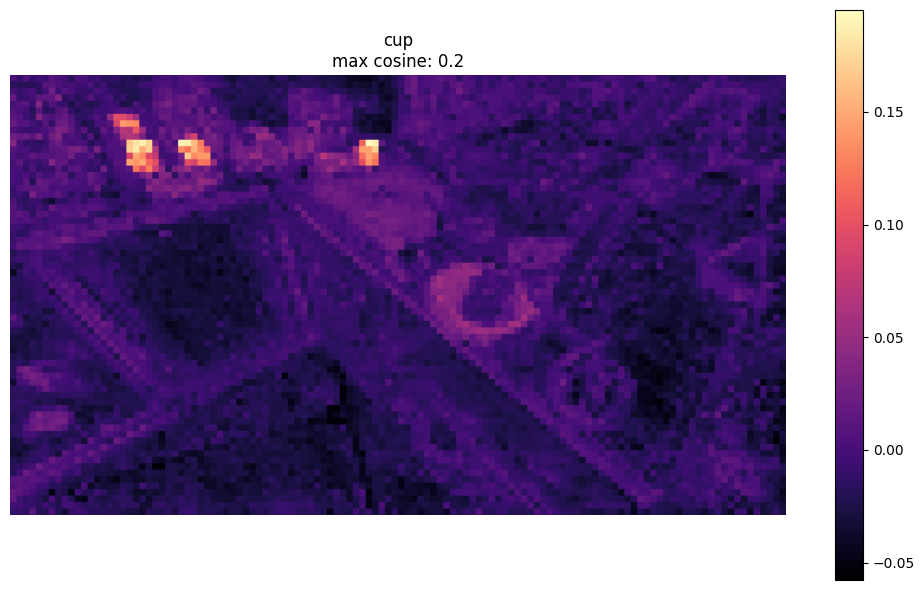

In [14]:
text = ['cup']
regenerate_all()

input_res=Resolution(height=176, width=272)


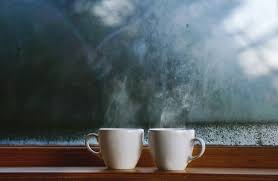

In [15]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/left_right.jpg')
image

image_features.shape=torch.Size([1, 11, 17, 1536])

similarity.shape=torch.Size([1, 11, 17, 1])
similarity.min()=tensor(-0.0322, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1383, device='cuda:0', dtype=torch.float16)


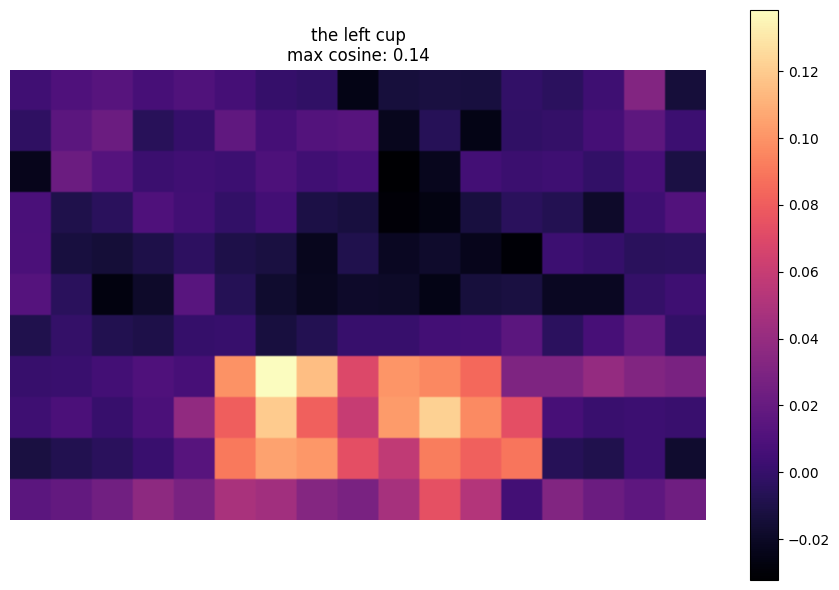

In [16]:
text = ['the left cup']
regenerate_all()

У RayFronts размер карты признаков зависит от размера входного изображения. Из-за того, что входное изображение низкого разрешения, карта признаков очень условная. Увеличим размер входа.

input_res=Resolution(height=880, width=1344)


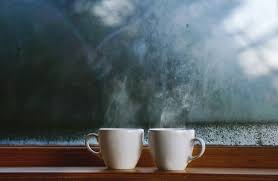

In [17]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/left_right.jpg', [880])
image

image_features.shape=torch.Size([1, 55, 84, 1536])

similarity.shape=torch.Size([1, 55, 84, 1])
similarity.min()=tensor(-0.0712, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1517, device='cuda:0', dtype=torch.float16)


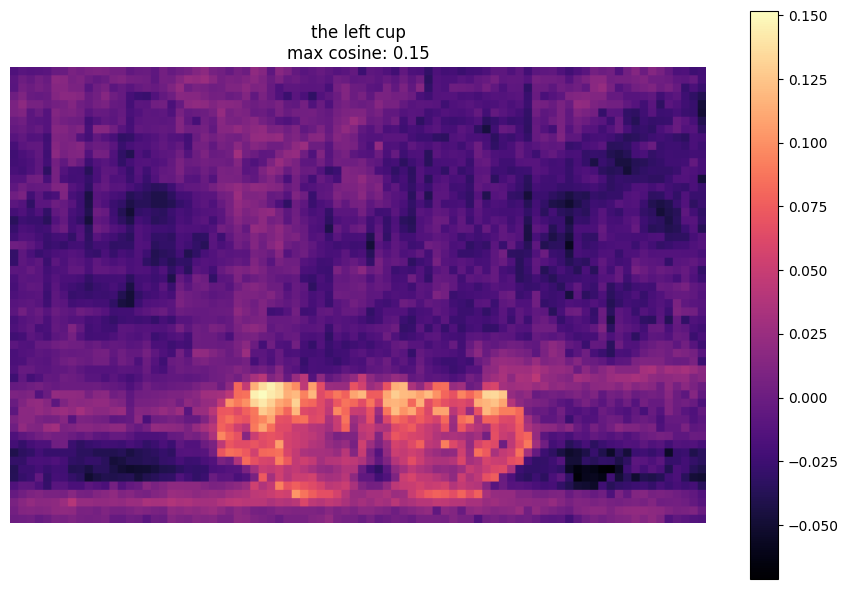

In [18]:
text = ['the left cup']
regenerate_all()

input_res=Resolution(height=480, width=704)


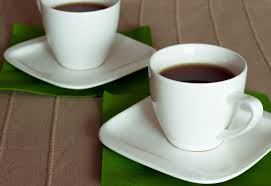

In [19]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/paralax_cup.jpg', [480])
image

image_features.shape=torch.Size([1, 30, 44, 1536])

similarity.shape=torch.Size([1, 30, 44, 1])
similarity.min()=tensor(-0.0459, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1630, device='cuda:0', dtype=torch.float16)


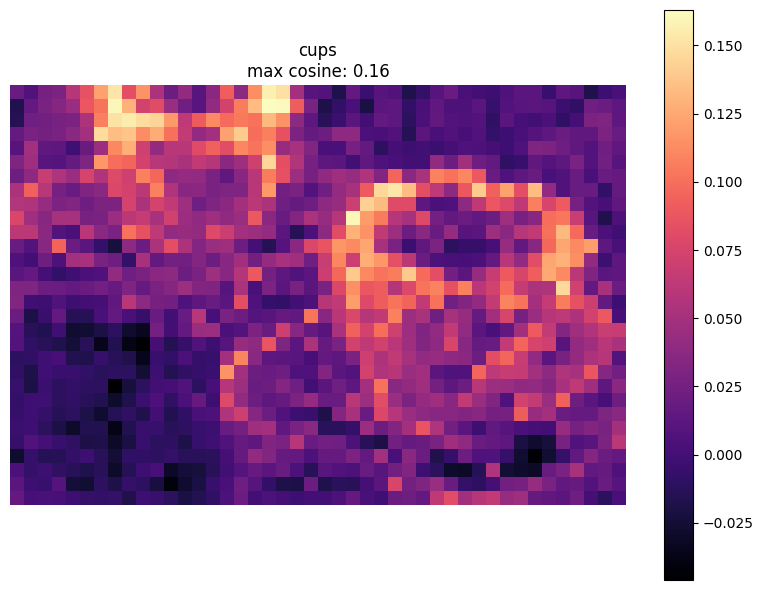

In [20]:
text = ['cups']
regenerate_all()

image_features.shape=torch.Size([1, 30, 44, 1536])

similarity.shape=torch.Size([1, 30, 44, 1])
similarity.min()=tensor(-0.0421, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1307, device='cuda:0', dtype=torch.float16)


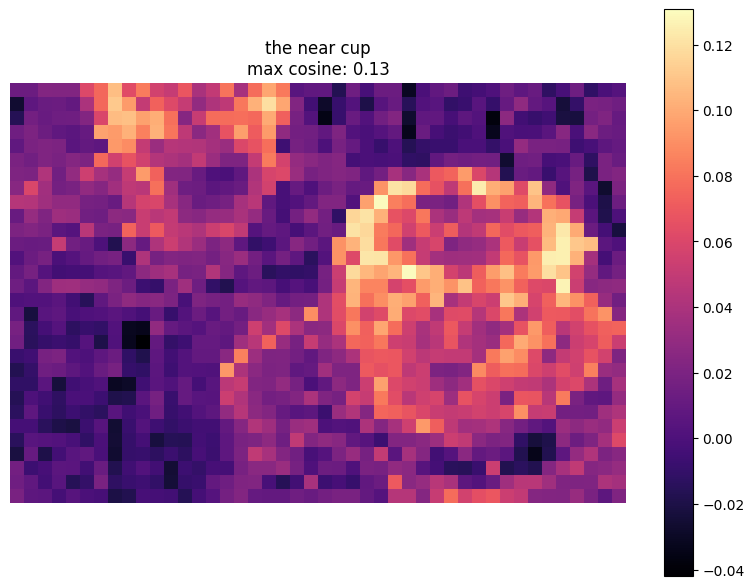

In [21]:
text = ['the near cup']
regenerate_all()

image_features.shape=torch.Size([1, 30, 44, 1536])

similarity.shape=torch.Size([1, 30, 44, 1])
similarity.min()=tensor(-0.0233, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1431, device='cuda:0', dtype=torch.float16)


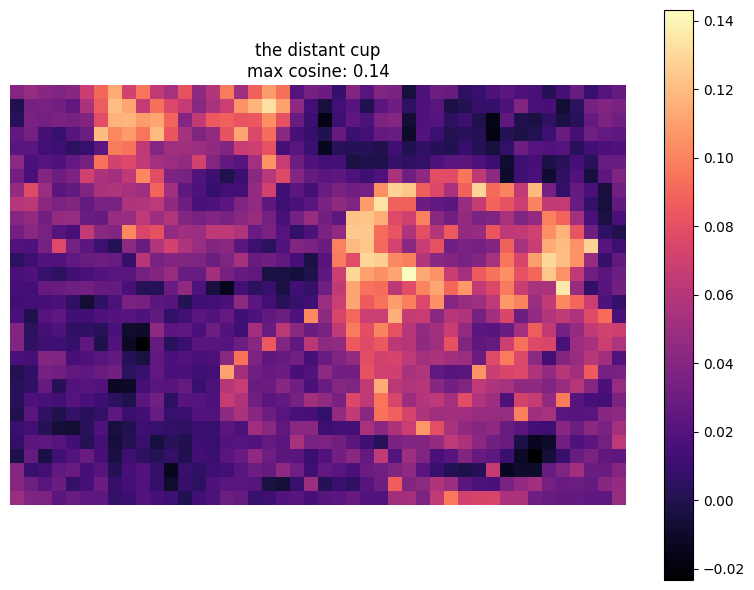

In [22]:
text = ['the distant cup']
regenerate_all()

input_res=Resolution(height=1120, width=1504)


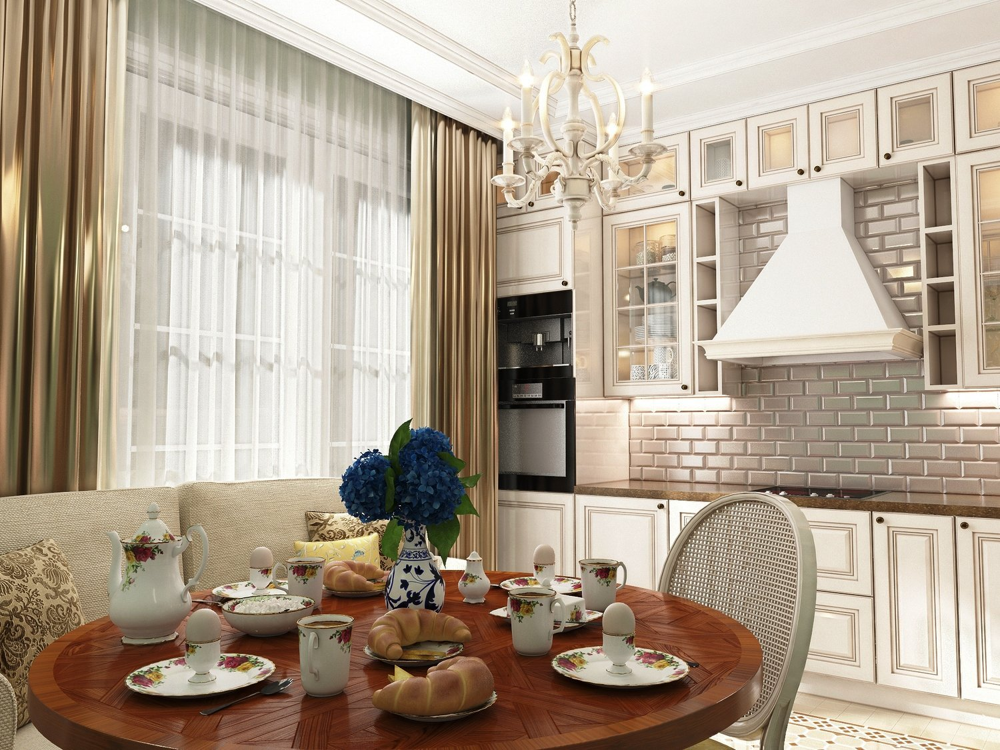

In [23]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/many_things.jpg')
image

image_features.shape=torch.Size([1, 70, 94, 1536])

similarity.shape=torch.Size([1, 70, 94, 1])
similarity.min()=tensor(-0.0555, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1936, device='cuda:0', dtype=torch.float16)


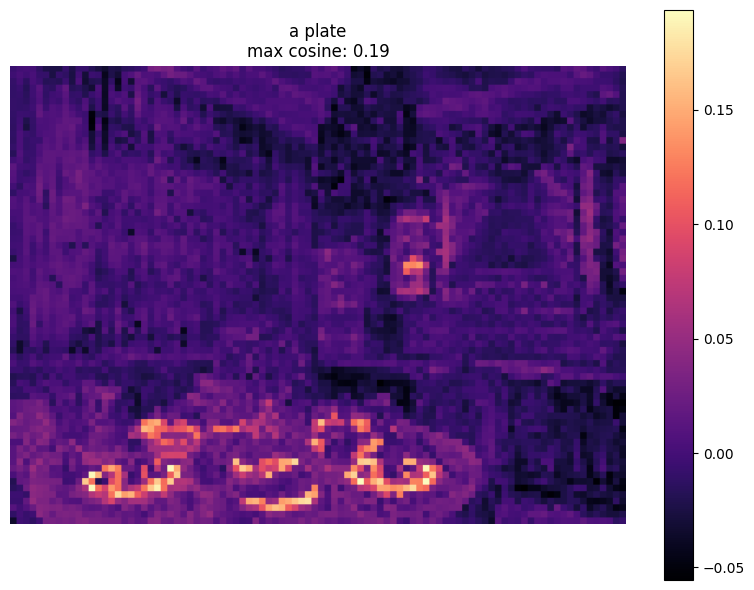

In [24]:
text = ['a plate']
regenerate_all()

image_features.shape=torch.Size([1, 70, 94, 1536])

similarity.shape=torch.Size([1, 70, 94, 1])
similarity.min()=tensor(-0.1086, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1420, device='cuda:0', dtype=torch.float16)


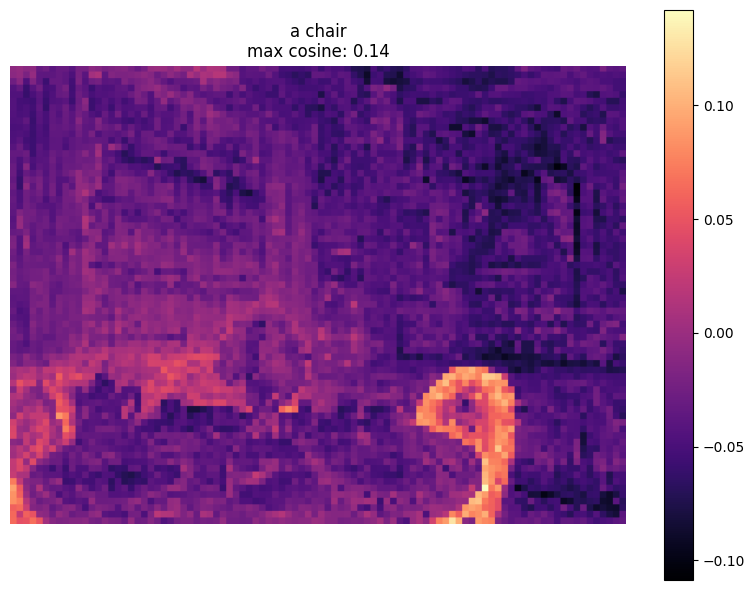

In [25]:
text = ['a chair']
regenerate_all()

image_features.shape=torch.Size([1, 70, 94, 1536])

similarity.shape=torch.Size([1, 70, 94, 1])
similarity.min()=tensor(-0.0809, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.2098, device='cuda:0', dtype=torch.float16)


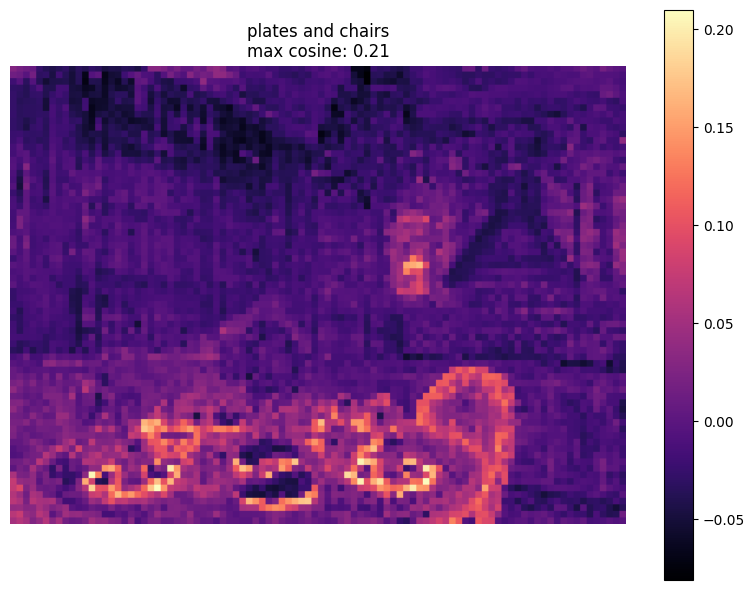

In [26]:
text = ['plates and chairs']
regenerate_all()

input_res=Resolution(height=976, width=736)


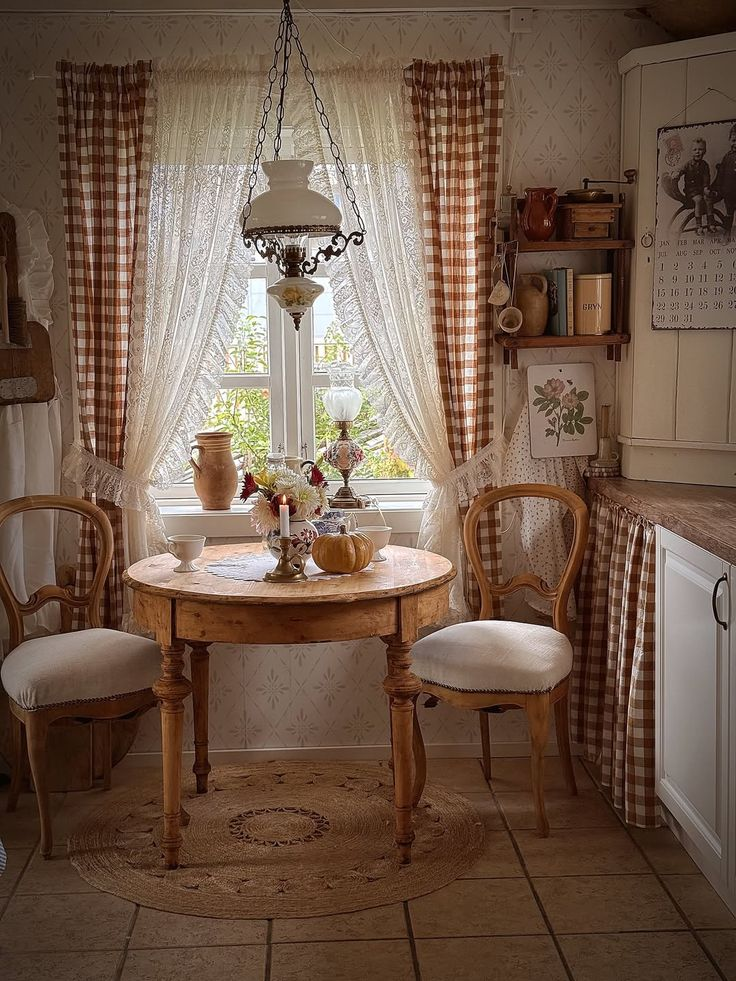

In [27]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/many_things2.jpg')
image

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0477, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1445, device='cuda:0', dtype=torch.float16)


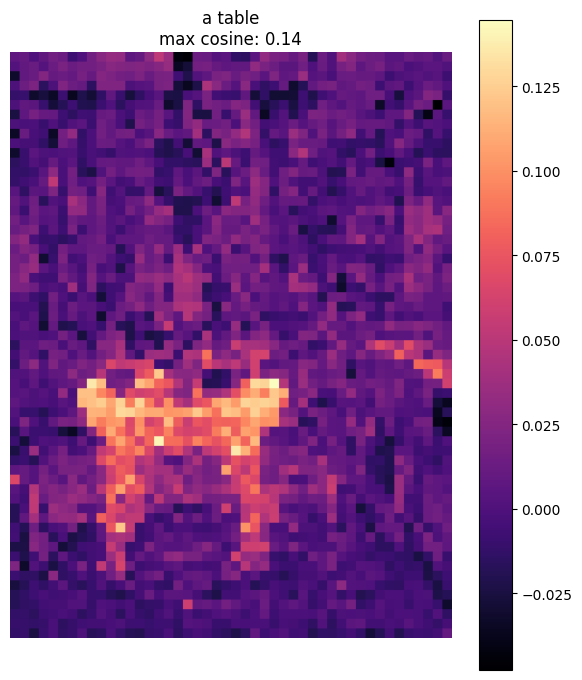

In [28]:
text = ['a table']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0878, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1484, device='cuda:0', dtype=torch.float16)


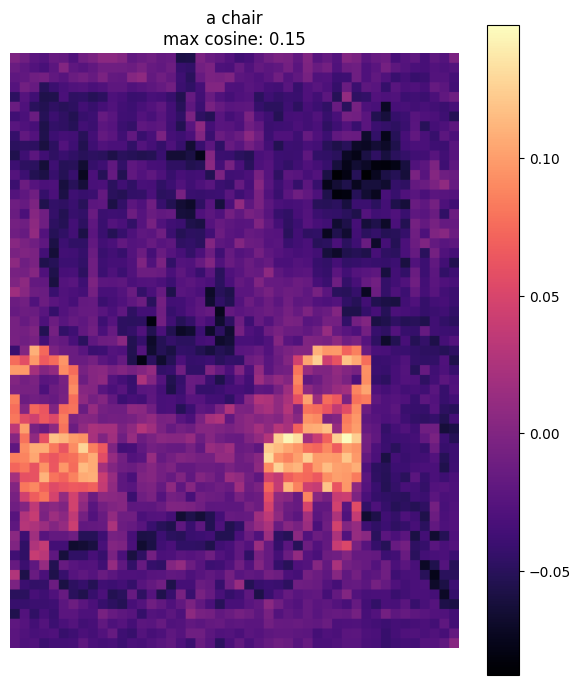

In [29]:
text = ['a chair']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0845, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1447, device='cuda:0', dtype=torch.float16)


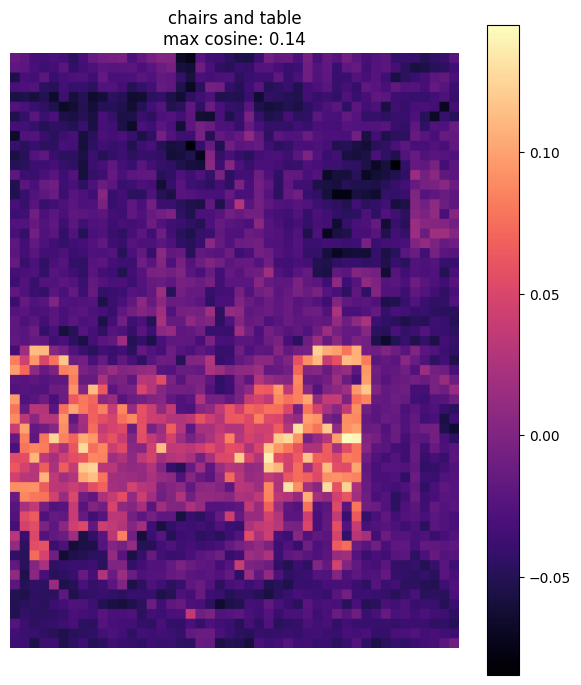

In [30]:
text = ['chairs and table']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0797, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1533, device='cuda:0', dtype=torch.float16)


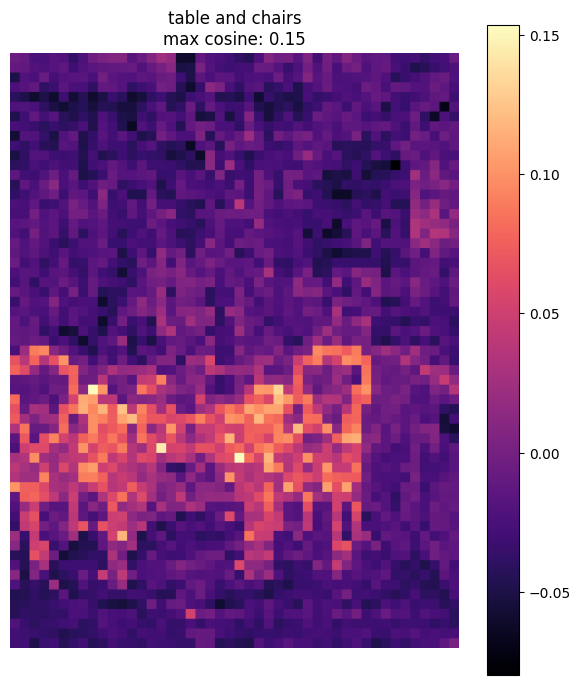

In [31]:
text = ['table and chairs']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0684, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1187, device='cuda:0', dtype=torch.float16)


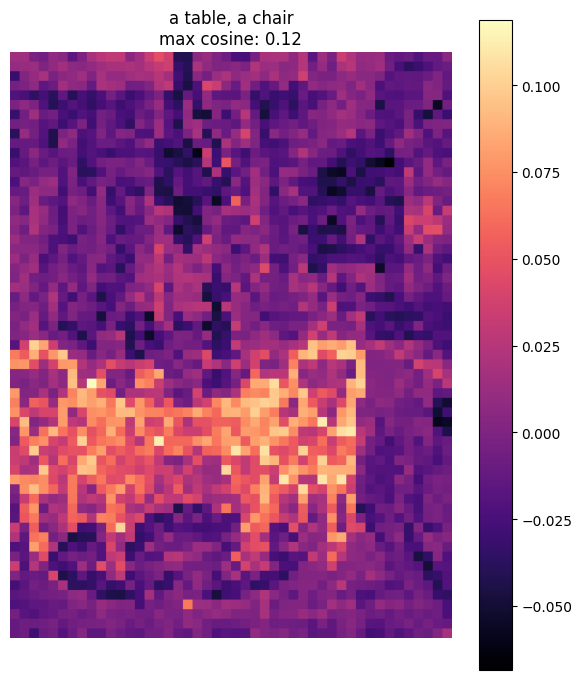

In [32]:
text = ['a table, a chair']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0773, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1919, device='cuda:0', dtype=torch.float16)


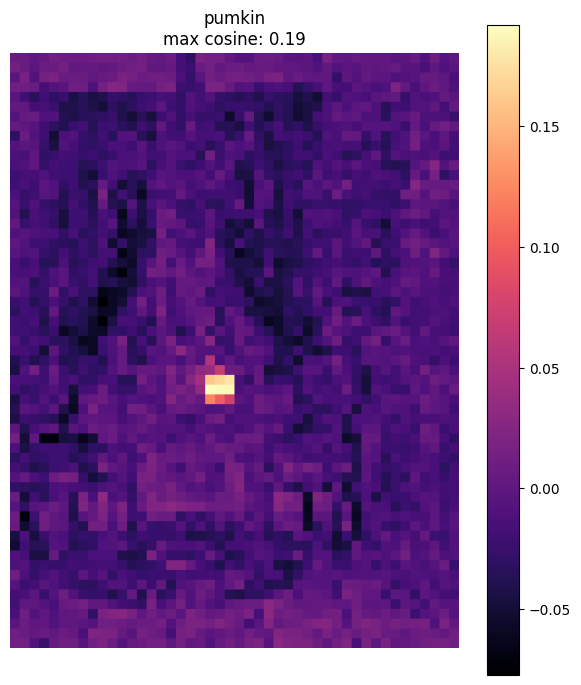

In [33]:
text = ['pumkin']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0953, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.2311, device='cuda:0', dtype=torch.float16)


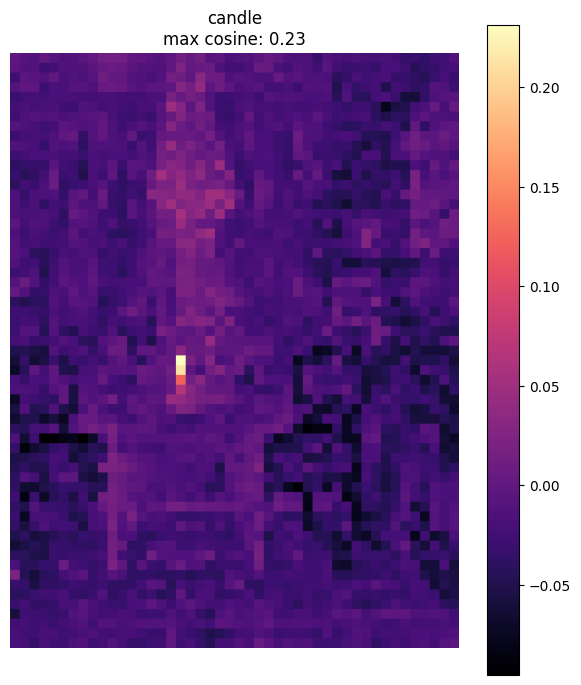

In [72]:
text = ['candle']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0894, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.2170, device='cuda:0', dtype=torch.float16)


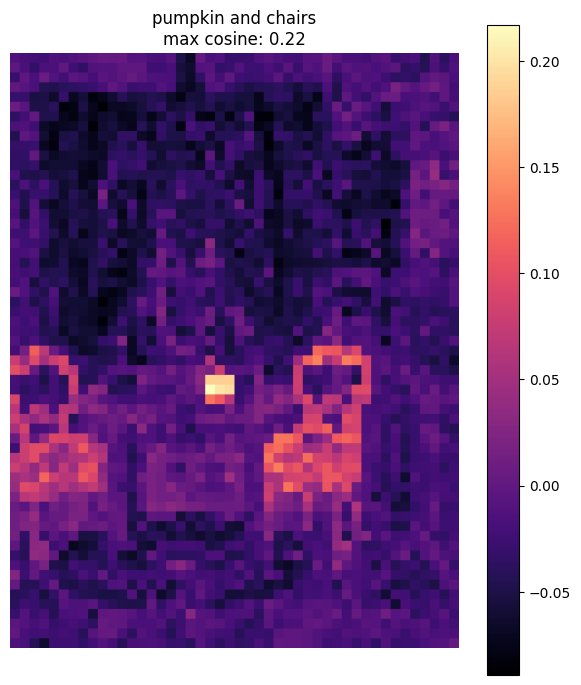

In [34]:
text = ['pumpkin and chairs']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0953, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.2311, device='cuda:0', dtype=torch.float16)


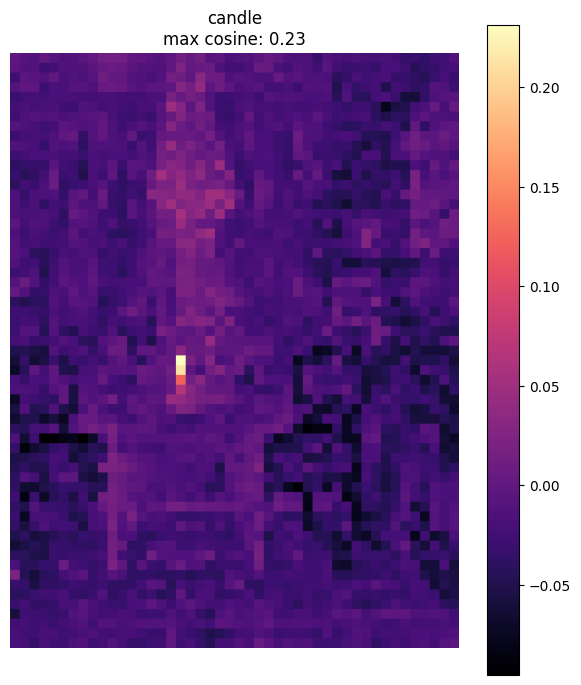

In [35]:
text = ['candle']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.1157, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.2161, device='cuda:0', dtype=torch.float16)


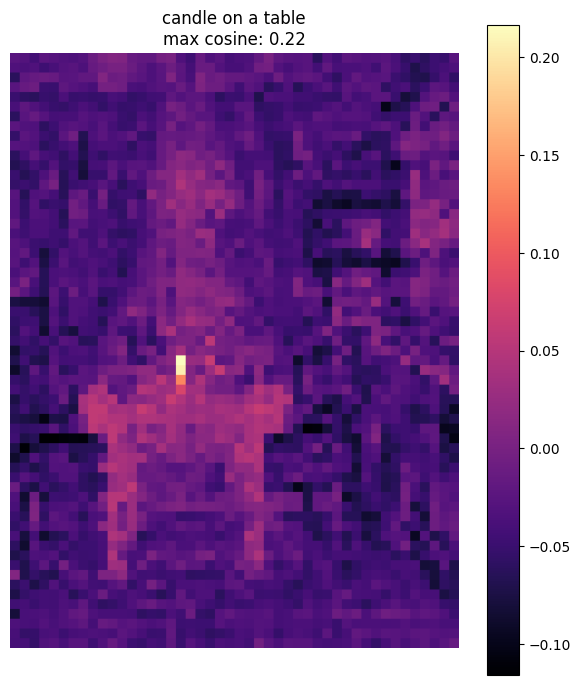

In [36]:
text = ['candle on a table']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0677, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1682, device='cuda:0', dtype=torch.float16)


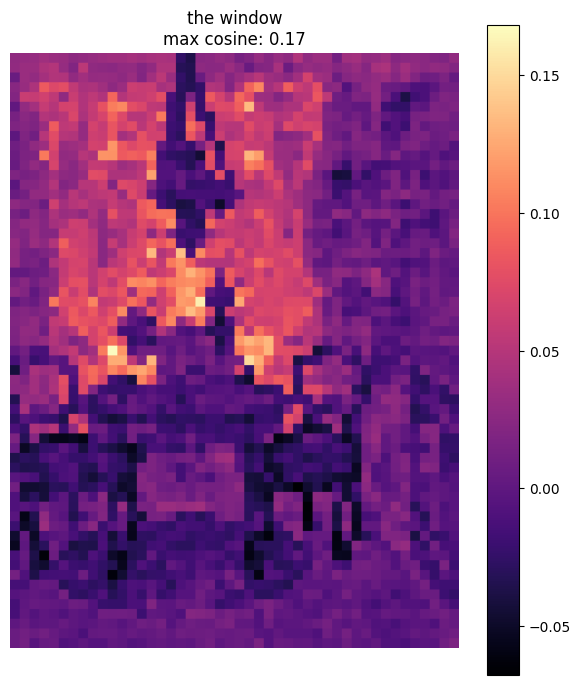

In [37]:
text = ['the window']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0733, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.2089, device='cuda:0', dtype=torch.float16)


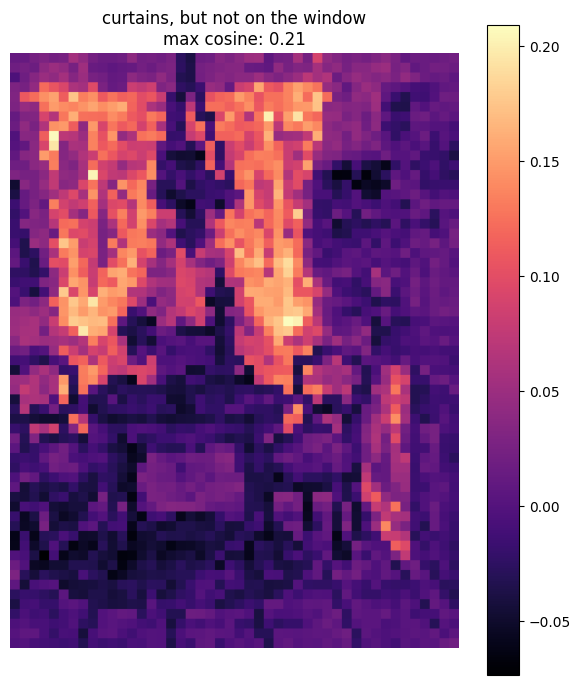

In [38]:
text = ['curtains, but not on the window']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0624, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.2047, device='cuda:0', dtype=torch.float16)


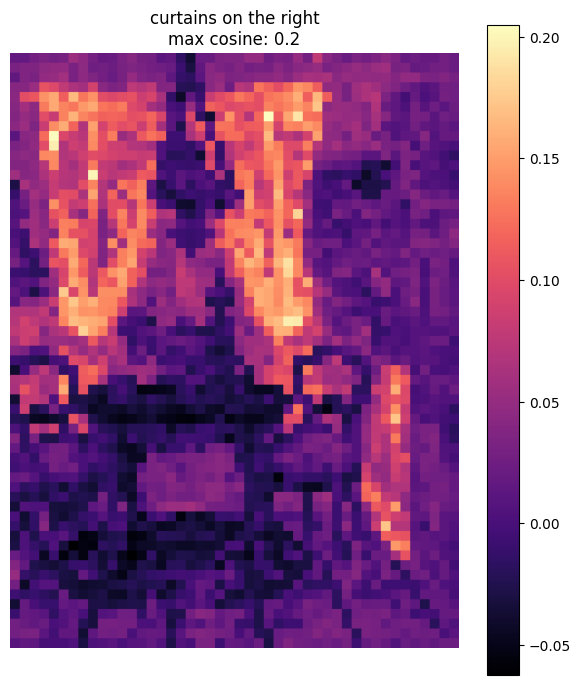

In [39]:
text = ['curtains on the right']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0608, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1254, device='cuda:0', dtype=torch.float16)


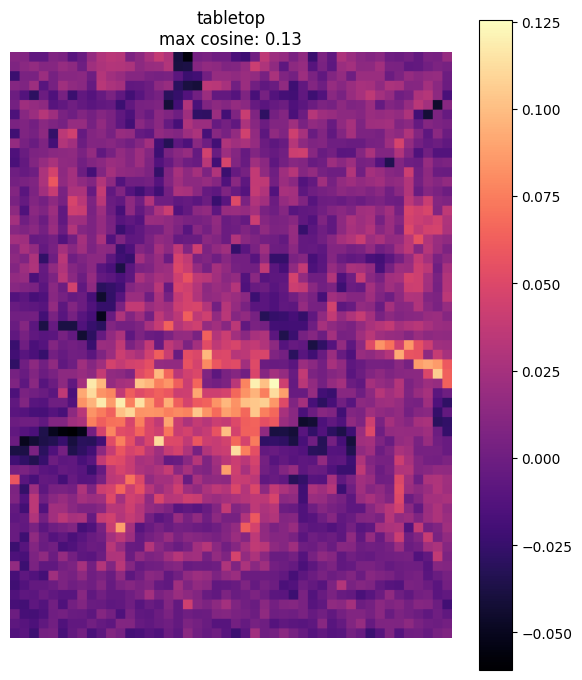

In [40]:
text = ['tabletop']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0765, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1987, device='cuda:0', dtype=torch.float16)


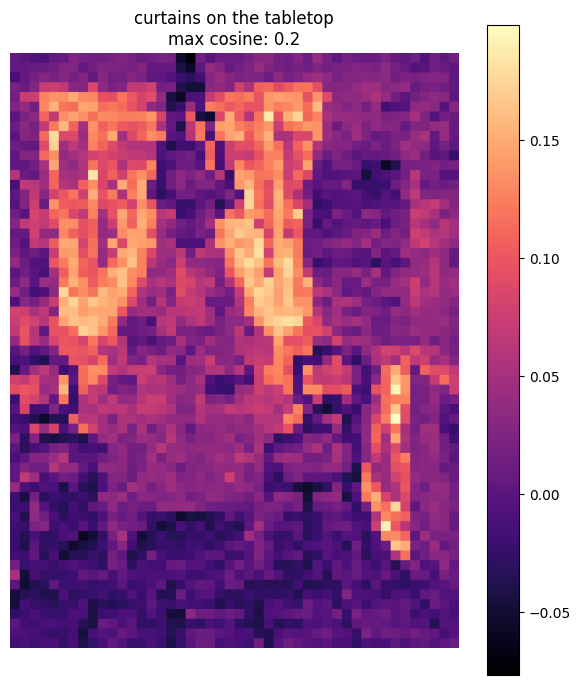

In [41]:
text = ['curtains on the tabletop']
regenerate_all()

image_features.shape=torch.Size([1, 61, 46, 1536])

similarity.shape=torch.Size([1, 61, 46, 1])
similarity.min()=tensor(-0.0997, device='cuda:0', dtype=torch.float16)
similarity.max()=tensor(0.1974, device='cuda:0', dtype=torch.float16)


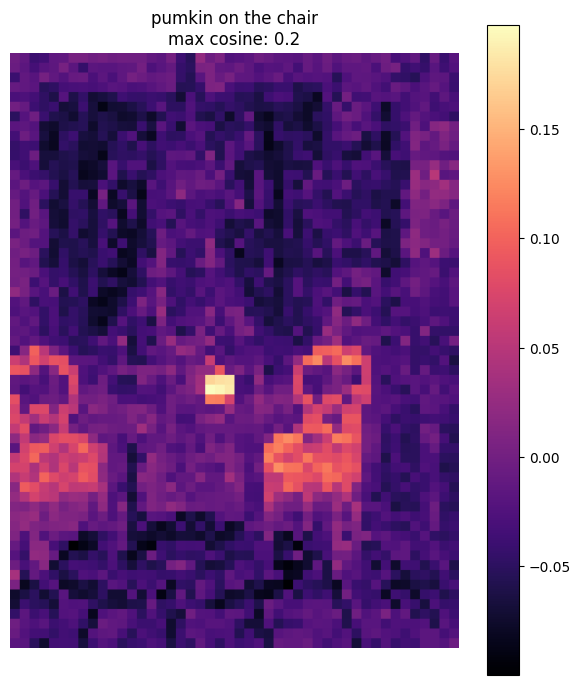

In [42]:
text = ['pumkin on the chair']
regenerate_all()

# Выводы

У RADIOv3 есть преимущество перед DINOv3 -- размер карты признаков напрямую зависит от размера входного изображения. Чтобы получить более плотную карту признаков, достаточно увеличить размер картинки (простой билинейной инерполяции достаточно, чтобы получить более внятные очертания объектов).

Минусы тоже есть: 
- Карта признаков RayFronts очень шумная по сравнению с Talk2DINO.
- Часто RayFronts выделяет лишь границы объектов. Talk2DINO выделяет все точки, принадлежащие объекту. То есть, с помощью RayFronts сложнее проводить сегментацию.
- Максимальное значение косинусной симметрии существенно ниже, чем у Talk2DINO. То есть, порог для отсеивания объектов подобрать сложнее.
- RayFront потребляет существенно больше видеопамяти, чем Talk2DINO: 14.9 GB против 1.5 GB на время всего теста.

Обе модели:
- Не различают цвета
- Не различают право и лево
- Слабо различают ближнее и далёкое
- Различают несколько объектов в запросе
- Не зависят от порядка перечисления объектов в запросе -- все объекты будут выделены вне зависимости от порядка их перечисления.
- Не различают обстоятельство места. Если указать обстоятельство места (на окне, на столе), то и подлежащее, и обстоятельство будут выделены моделями. Но обстоятельство будет выделено немного слабее подлежащего. Если, скажем, объект есть на столе, но его нет на стуле, а в запросе указано "объект на стуле", то модель выделит объект на столе и стул.
- Не различают отрицания в запросе.
